In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import re
from glob import glob
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

# Image Segmentation

The concept of **image segmentation** is a deeper dive into the realm of computer vision and image processing. It builds upon the idea of object detection, and as a result opens up many more possibilities with the data at hand. 

In image segmentation, images are not dealt with as a whole. They are divided into segments, where the regions of importance lie.
While object detection deals with plotting bounding boxes around images of a specific class, image segmentation focuses on creating a pixel-wise mask around the image itself. And from this, its clear that image segmentation can lead us to a much better understanding of the image instance itself, rather than just what class it belongs to.
There's a much more granular understanding of the object(s) in the image. 



Image Segmentation is of two types: 
1. Semantic Segmentation - ***class instance*** segmentation
2. Instance Segmentation - ***individual instance*** segmentation

![imagerec.jpg](https://valueml.com/wp-content/uploads/2020/11/DV8TLgkWsAEGsEs-1024x485.jpg)

When detecting cells, the shape is a vital characteristic that **can't not** be taken into account, especially when dealing with potentially fatal ones, such as cancerous cells.

With this data, the task is to detect and delienate distinct neuronal cell types from microscopic images used in neurological disorder studies, and train a model for instance segmentation of neuronal cells.

# **Annotations**

Provided annotations are given as run length encoded masks. There's a few number of images in the dataset, however the number of annotations is quite high. The annotations are provided in full, including any overlap that exists between any cells.



***RLE***

Run-length encoding (RLE) is a form of lossless data compression in which *runs* of data (sequences in which the same data value occurs in many consecutive data elements) are stored as a single data value and count, rather than as the original run.

This is most efficient on data that contains many such runs, for example, simple graphic images such as icons, line drawings etc. For files that do not have many runs, RLE could increase the file size.

Let's take an example of some text of a 30 length sequence


**AAADDDEERRRRTTTTHHJJKKKCCCCCC**

In RLE, we represent it as:

**A3D3E2R4T4H2J2K3C6**


The 30 length sequence text data is compressed to an 18 length sequence.

In [3]:
train = pd.read_csv('../input/sartorius-cell-instance-segmentation/train.csv')
train.head()

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00


A decoding function for the run length that returns an numpy image array,
with images of the masked cells after decoding the annotations

Text(0.5, 1.0, 'multiple cells')

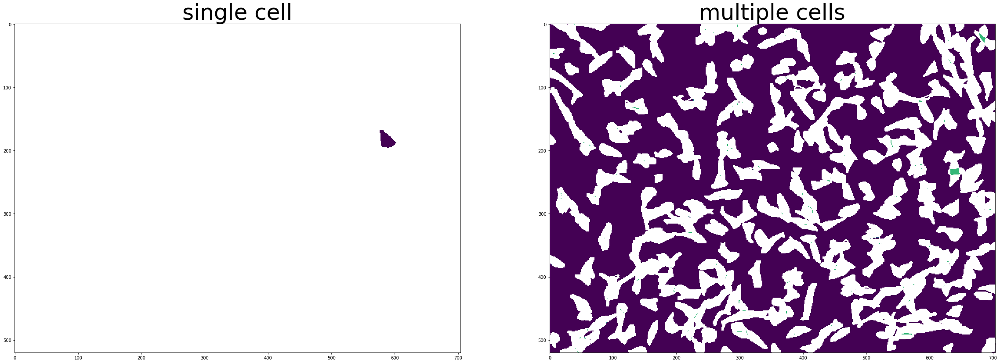

In [4]:
def rle_decode(mask_rle, shape=(520, 704)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape)

_, axs = plt.subplots(1,2, figsize=(40,15))

enc=train['annotation'][0]
dec = rle_decode(enc)


axs[0].imshow(np.ma.masked_where(dec==0, dec))


df=train[train['id']=='0030fd0e6378']
dec1=np.zeros((520,704))
for j in range(395):
    dec1+=rle_decode(df['annotation'][j])

axs[1].imshow(np.ma.masked_where(dec1==1,dec1))  

axs[0].set_title("single cell",fontsize=50)
axs[1].set_title("multiple cells",fontsize=50)

*The whites are the cells in the multiple cells plot*

# Data - Overview

In [5]:
# training images count
train_images = os.listdir('../input/sartorius-cell-instance-segmentation/train')
print("Length of train images: {}".format(len(train_images)))

# train annotations count
print("Length of train annotations: {}".format(len(train['annotation'])))

# average annotations per image
all_annotations = []
for annotation in train['annotation']:
    dec_annotation = rle_decode(annotation)
    all_annotations.append(dec_annotation)
print("Average annotations per image: {}".format((len(all_annotations))/len(train_images)))


# train semi-supervised images count (no annotations)
train_semi_images = os.listdir('../input/sartorius-cell-instance-segmentation/train_semi_supervised')
print("Length of non-annotated train images: {}".format(len(train_semi_images)))

Length of train images: 606
Length of train annotations: 73585
Average annotations per image: 121.42739273927393
Length of non-annotated train images: 1972


In [6]:
train.drop(columns=['elapsed_timedelta'], inplace=True)

# train data shape
print("Train data shape: {}".format(train.shape))

# train data memory
print("Train data memory: {:0.2f} MB".format(train.memory_usage().sum() /1024 ** 2))

Train data shape: (73585, 8)
Train data memory: 4.49 MB


***Metadata***

The file names for the non-annotated images contain all their information, and can be set aside in a metadata file for further analysis if need be, or appended to the train file for a more comprehensive analysis.

In [7]:
def parse_filename(filename):
    
    image_id = filename.split('.')[0]
    cell_type = filename.split('[')[0]
    filename_split = filename.split('_')
    plate_time = filename_split[-3]
    sample_date = filename_split[-4]
    sample_id = '_'.join(filename_split[:3]) + '_' + '_'.join(filename_split[-2:]).split('.')[0]
    
    return image_id, cell_type, plate_time, sample_date, sample_id


for filename in tqdm(train_semi_images):
    image_id, cell_type, plate_time, sample_date, sample_id = parse_filename(filename)
    sample = {
        'id': image_id,
        'annotation': np.nan,
        'width': 704,
        'height': 520,
        'cell_type': cell_type,
        'plate_time': plate_time,
        'sample_date': sample_date,
        'sample_id': sample_id
    }
    train = train.append(sample, ignore_index=True)
    
train['cell_type'] = train['cell_type'].str.rstrip('s')
print(f'Training Set Shape: {train.shape}')
print(f'Memory Usage: {train.memory_usage().sum() / 1024 ** 2:.2f} MB')

  0%|          | 0/1972 [00:00<?, ?it/s]

Training Set Shape: (75557, 8)
Memory Usage: 4.61 MB


***Additional metadata feature extraction***

Image mean (`image_mean`) and standard deviation (`image_std`) are extracted from both the annotated and the non-annotated images.
Mask area (`mask_area`) and number of annotations (`annotation_count`) are extracted from the annotated only images.

In [8]:
# annotated
for image_id in tqdm(train.loc[~train['annotation'].isnull(), 'id'].unique()):
    
    image = cv2.imread(f'../input/sartorius-cell-instance-segmentation/train/{image_id}.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # mean and std
    train.loc[train['id'] == image_id, 'image_mean'] = np.mean(image)
    train.loc[train['id'] == image_id, 'image_std'] = np.std(image)
    
    # mask area
    for rle_mask in train.loc[train['id'] == image_id, 'annotation']:
        
        mask = rle_decode(rle_mask, (520, 704))
        train.loc[(train['id'] == image_id) & (train['annotation'] == rle_mask), 'mask_area'] = np.sum(mask)
    
# non-annotated
for image_id in tqdm(train.loc[train['annotation'].isnull(), 'id'].unique()):
    
    image = cv2.imread(f'../input/sartorius-cell-instance-segmentation/train_semi_supervised/{image_id}.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    train.loc[train['id'] == image_id, 'image_mean'] = np.mean(image)
    train.loc[train['id'] == image_id, 'image_std'] = np.std(image)

# annotation count
annotation_counts = train.loc[~train['annotation'].isnull()].groupby('id')['annotation'].count()
train['annotation_count'] = train['id'].map(annotation_counts)

train.to_csv('train_processed.csv', index=False)

  0%|          | 0/606 [00:00<?, ?it/s]

  0%|          | 0/1972 [00:00<?, ?it/s]

# Cell Types

There are 3 cell types:
1. cort (neurons)
2. shsy5y (neuroblastoma)
3. astro (astrocytes)

Their distribution in both the annotated and non-annotated images is as below:


In [9]:
train.cell_type.value_counts().to_frame()

,cell_type
shsy5y,52754
astro,11530
cort,11273


Group similar id instances together.

In [10]:
df_train_all_cell_types = train.groupby('id')['cell_type'].first().reset_index()
df_train_all_cell_types['cell_type'].value_counts().to_frame()

,cell_type
astro,1139
cort,816
shsy5y,623


***Annotation count***,
***Mask area***,
***Mean***,
***Standard Deviation***.


annotation_count
----------------
cort Mean: 33.6781  -  Median: 30.0000  -  Std: 16.4964 - Min: 4.0000 -  Max: 108.0000
shsy5y Mean: 337.3290  -  Median: 324.0000  -  Std: 149.5954 - Min: 49.0000 -  Max: 790.0000
astro Mean: 80.3206  -  Median: 73.0000  -  Std: 64.1304 - Min: 5.0000 -  Max: 594.0000


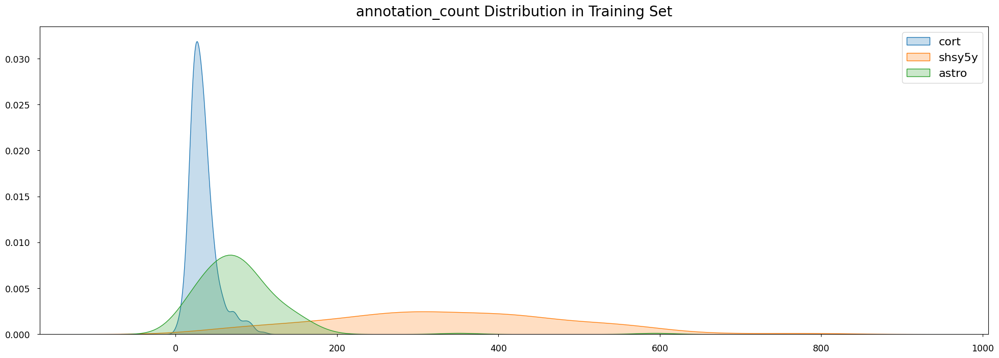

mask_area
---------
cort Mean: 240.1645  -  Median: 208.0000  -  Std: 139.1664 - Min: 33.0000 -  Max: 2054.0000
shsy5y Mean: 224.4963  -  Median: 193.0000  -  Std: 133.9388 - Min: 30.0000 -  Max: 2254.0000
astro Mean: 905.8057  -  Median: 665.0000  -  Std: 855.1877 - Min: 37.0000 -  Max: 13327.0000


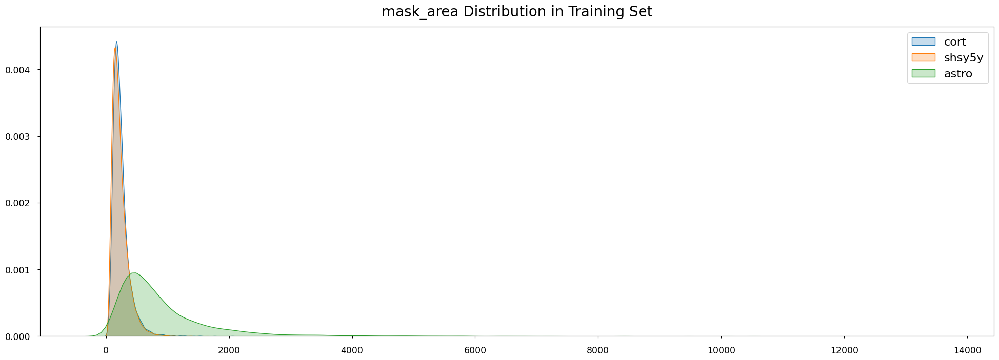

image_mean
----------
cort Mean: 127.9549  -  Median: 127.9589  -  Std: 0.0518 - Min: 127.7864 -  Max: 128.1188
shsy5y Mean: 127.9764  -  Median: 127.9737  -  Std: 0.0646 - Min: 127.7955 -  Max: 128.2085
astro Mean: 127.9898  -  Median: 127.9916  -  Std: 0.0325 - Min: 127.7521 -  Max: 128.1443


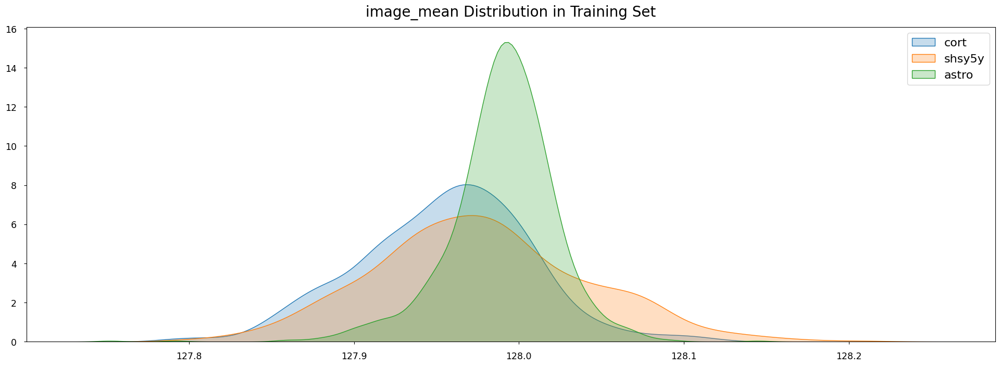

image_std
---------
cort Mean: 14.5775  -  Median: 14.4896  -  Std: 2.6951 - Min: 8.4036 -  Max: 21.9799
shsy5y Mean: 13.2764  -  Median: 13.6487  -  Std: 2.4507 - Min: 3.8756 -  Max: 18.1883
astro Mean: 8.6610  -  Median: 8.3320  -  Std: 2.2959 - Min: 3.1541 -  Max: 24.1878


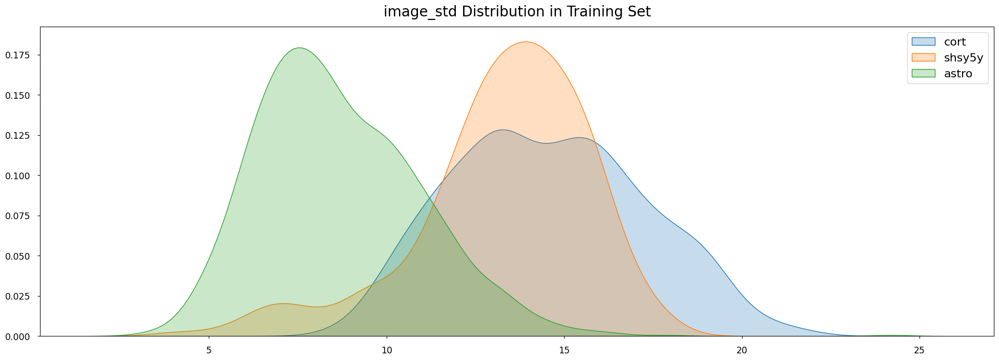

In [11]:
def visualize_feature_distribution_for_cell_types(df, feature):
    
    if feature == 'annotation_count' or feature == 'image_mean' or feature == 'image_std':
        df = df.groupby('id').first()
        
    print(f'{feature}\n{"-" * len(feature)}')
    print(f'cort Mean: {df.loc[df["cell_type"] == "cort"][feature].mean():.4f}  -  Median: {df.loc[df["cell_type"] == "cort"][feature].median():.4f}  -  Std: {df.loc[df["cell_type"] == "cort"][feature].std():.4f} - Min: {df.loc[df["cell_type"] == "cort"][feature].min():.4f} -  Max: {df.loc[df["cell_type"] == "cort"][feature].max():.4f}')
    print(f'shsy5y Mean: {df.loc[df["cell_type"] == "shsy5y"][feature].mean():.4f}  -  Median: {df.loc[df["cell_type"] == "shsy5y"][feature].median():.4f}  -  Std: {df.loc[df["cell_type"] == "shsy5y"][feature].std():.4f} - Min: {df.loc[df["cell_type"] == "shsy5y"][feature].min():.4f} -  Max: {df.loc[df["cell_type"] == "shsy5y"][feature].max():.4f}')
    print(f'astro Mean: {df.loc[df["cell_type"] == "astro"][feature].mean():.4f}  -  Median: {df.loc[df["cell_type"] == "astro"][feature].median():.4f}  -  Std: {df.loc[df["cell_type"] == "astro"][feature].std():.4f} - Min: {df.loc[df["cell_type"] == "astro"][feature].min():.4f} -  Max: {df.loc[df["cell_type"] == "astro"][feature].max():.4f}')

    fig, ax = plt.subplots(figsize=(24, 8), dpi=100)
    sns.kdeplot(df.loc[df['cell_type'] == 'cort'][feature], label='cort', fill=True)
    sns.kdeplot(df.loc[df['cell_type'] == 'shsy5y'][feature], label='shsy5y', fill=True)
    sns.kdeplot(df.loc[df['cell_type'] == 'astro'][feature], label='astro', fill=True)
    
    ax.legend(prop={'size': 16})
    ax.tick_params(axis='x', labelsize=12.5, pad=10)
    ax.tick_params(axis='y', labelsize=12.5, pad=10)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(f'{feature} Distribution in Training Set', fontsize=20, pad=15)
    
    plt.show()
features = ['annotation_count', 'mask_area', 'image_mean', 'image_std']
for feature in features:
    visualize_feature_distribution_for_cell_types(df=train, feature=feature)

* Number of annotations distribution is in a small range for cort cell lines, but the range increases in astro cell lines and it increases even more in shsy5y cell lines.
* Area of annotations distributions are quite similar in cort and shsy5y cell lines since the cells from both of those cell lines are very alike in terms of size. Average size of astrocytes are larger than those two cell types but size of an astrocyte can be between 37 and 13327 pixels. 
* Astro cell line has a very different distribution in image mean and in image standard deviation, compared to the other two cells that follow a slightly similar pattern

Based on the above observations, cut-off points can be made to discard smaller instances of objects in the train set, hence minimizing the number of masks to predict when building a model.

# Image Visualization - Each Cell Type  

The annotated images, along with their segmentation masks can be visualised - keeping note of any visible differences between the three cell types

In [12]:
def visualize_image(df, image_id):

    """
    Visualize image along with segmentation masks

    Parameters
    ----------
    df [pandas.DataFrame of shape (73585, 9)]: Training dataframe
    image_id (str): Image ID (filename)
    """
    # locate first of each instance
    image_path = df.loc[df['id'] == image_id, 'id'].values[0]
    cell_type = df.loc[df['id'] == image_id, 'cell_type'].values[0]
    annotation_count = df.loc[df['id'] == image_id, 'annotation_count'].values[0]
    plate_time = df.loc[df['id'] == image_id, 'plate_time'].values[0]
    sample_date = df.loc[df['id'] == image_id, 'sample_date'].values[0]
    sample_id = df.loc[df['id'] == image_id, 'sample_id'].values[0]
    
    # read and transform channel - grayscaled
    image = cv2.imread(f'../input/sartorius-cell-instance-segmentation/train/{image_path}.png')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # statistical analysis
    print(f'{image_id}\n{"-" * len(image_id)}')
    print(f'Image Mean: {np.mean(image):.4f}  -  Median: {np.median(image):.4f}  -  Std: {np.std(image):.4f} - Min: {np.min(image):.4f} -  Max: {np.max(image):.4f}')
    
    # visual
    fig, axes = plt.subplots(figsize=(20, 20), ncols=2)
    fig.tight_layout(pad=5.0)
    
    axes[0].imshow(image, cmap='gray')
    masks = []
    for mask in df.loc[df['id'] == image_id, 'annotation'].values:
        decoded_mask = rle_decode(mask, shape=image.shape)
        masks.append(decoded_mask)
    mask = np.stack(masks)
    mask = np.any(mask == 1, axis=0)
    axes[1].imshow(image, cmap='gray')
    axes[1].imshow(mask, alpha=0.6)
    
    for i in range(2):
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
        axes[i].tick_params(axis='x', labelsize=15, pad=10)
        axes[i].tick_params(axis='y', labelsize=15, pad=10)
        
    axes[0].set_title(f'{image_path} - {cell_type} - {int(annotation_count)} Annotations\n{plate_time} - {sample_date} - {sample_id}', fontsize=20, pad=15)
    axes[1].set_title('Segmentation Mask', fontsize=20, pad=15)
    plt.show()
    plt.close(fig)

1. ***Neurons (Cort)***

01ae5a43a2ab
------------
Image Mean: 127.9166  -  Median: 129.0000  -  Std: 15.9734 - Min: 3.0000 -  Max: 255.0000


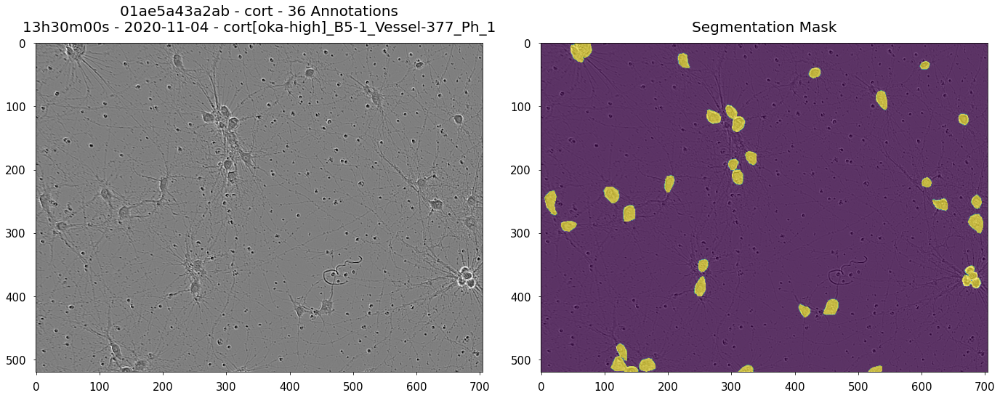

026b3c2c4b32
------------
Image Mean: 128.0179  -  Median: 129.0000  -  Std: 17.5364 - Min: 3.0000 -  Max: 255.0000


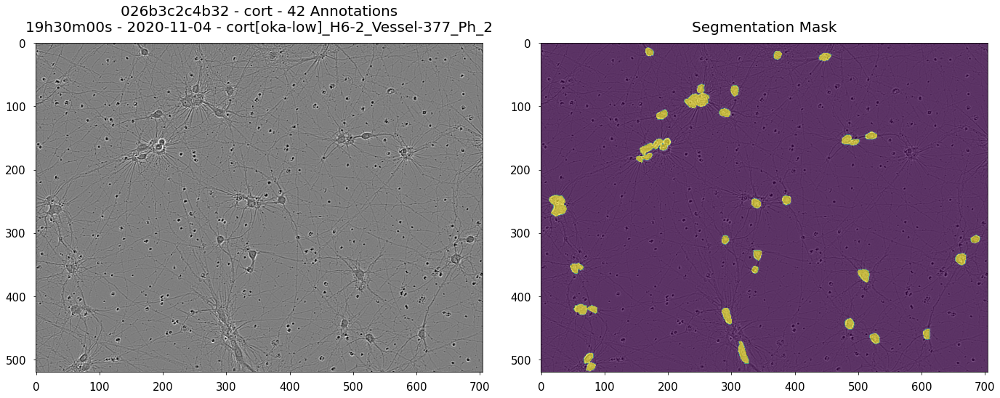

029e5b3b89c7
------------
Image Mean: 127.9574  -  Median: 128.0000  -  Std: 12.7198 - Min: 3.0000 -  Max: 255.0000


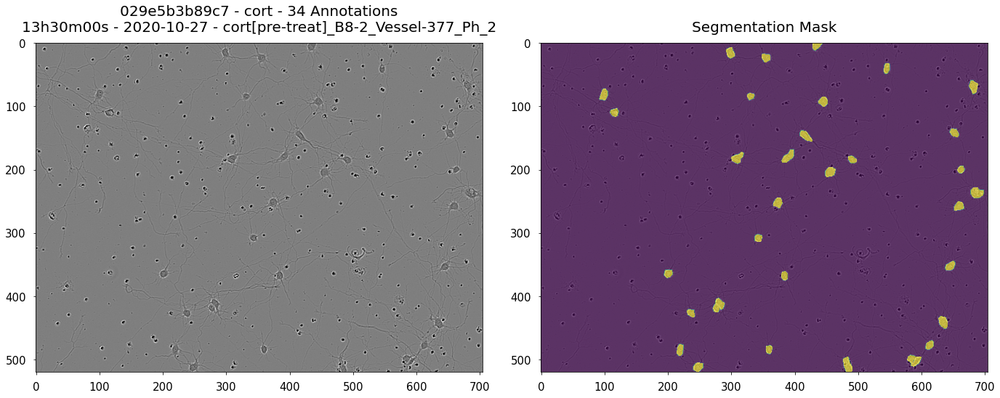

0323e81d23d9
------------
Image Mean: 127.9819  -  Median: 129.0000  -  Std: 12.9866 - Min: 3.0000 -  Max: 255.0000


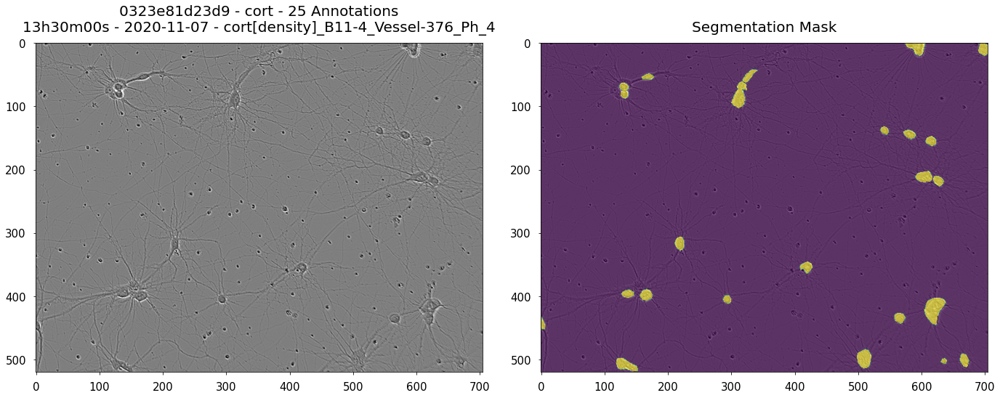

03b27b381a5f
------------
Image Mean: 127.9679  -  Median: 129.0000  -  Std: 15.1915 - Min: 3.0000 -  Max: 255.0000


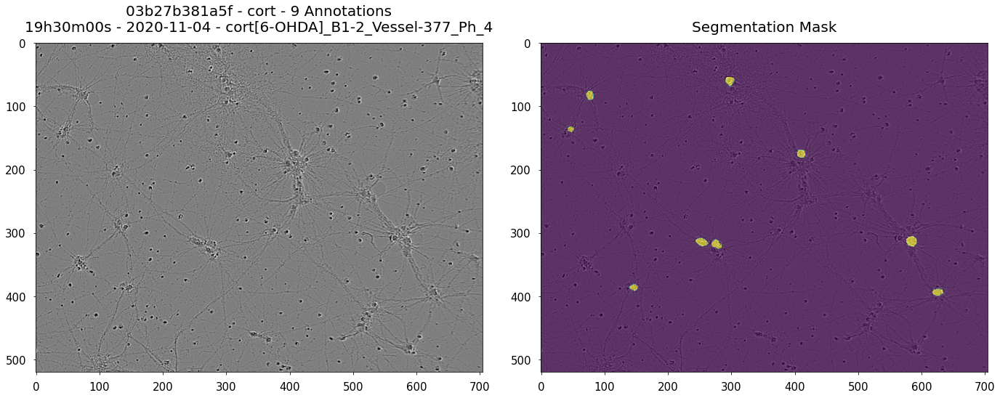

04928f0866b0
------------
Image Mean: 127.9515  -  Median: 129.0000  -  Std: 14.2133 - Min: 3.0000 -  Max: 255.0000


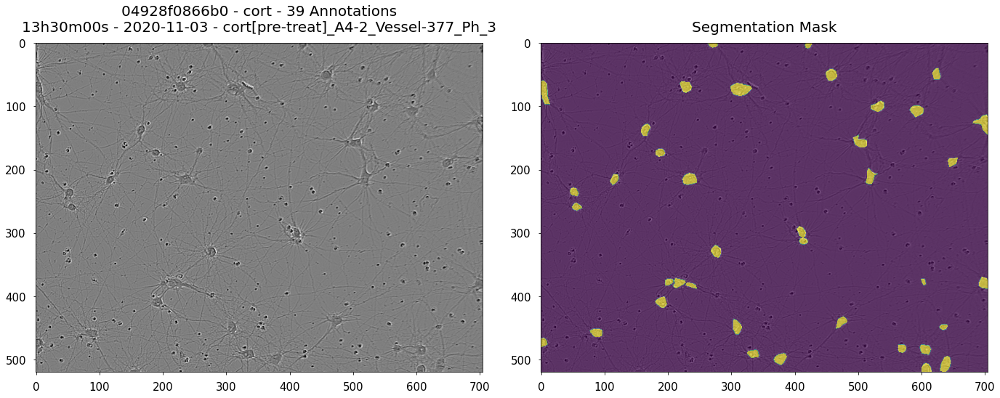

049f02e0f764
------------
Image Mean: 127.9316  -  Median: 129.0000  -  Std: 19.3692 - Min: 3.0000 -  Max: 255.0000


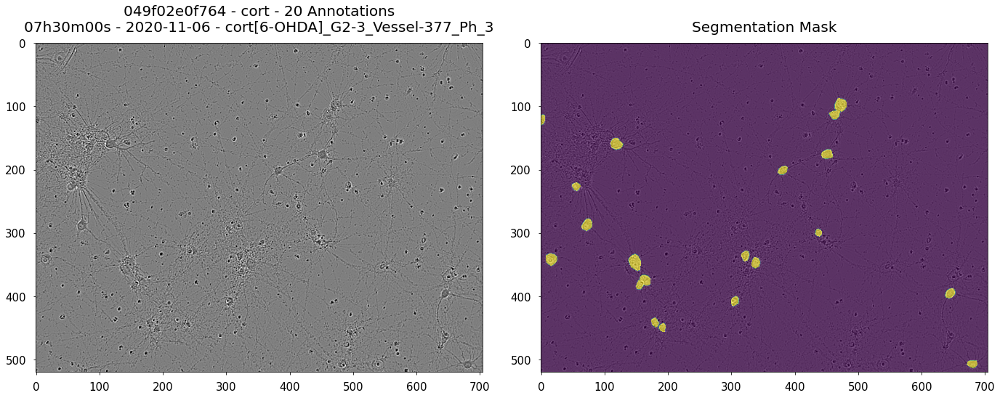

053d61766edb
------------
Image Mean: 127.8645  -  Median: 129.0000  -  Std: 19.1696 - Min: 1.0000 -  Max: 255.0000


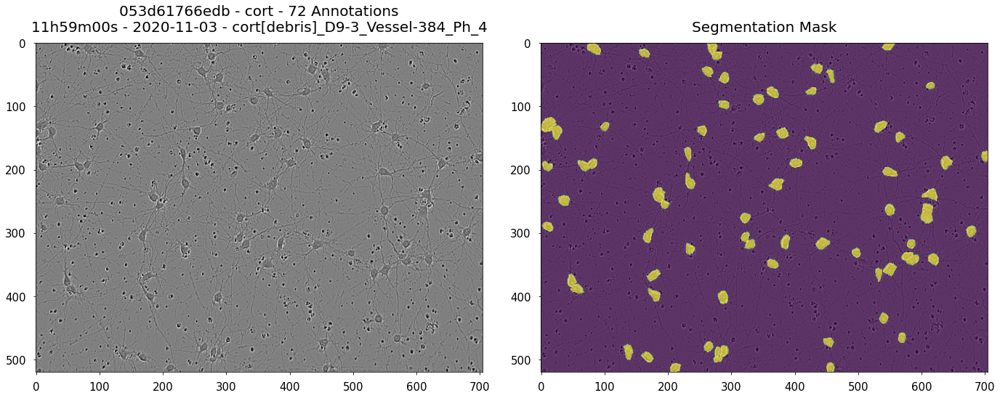

05c61f0f46b7
------------
Image Mean: 127.9319  -  Median: 128.0000  -  Std: 14.9739 - Min: 3.0000 -  Max: 255.0000


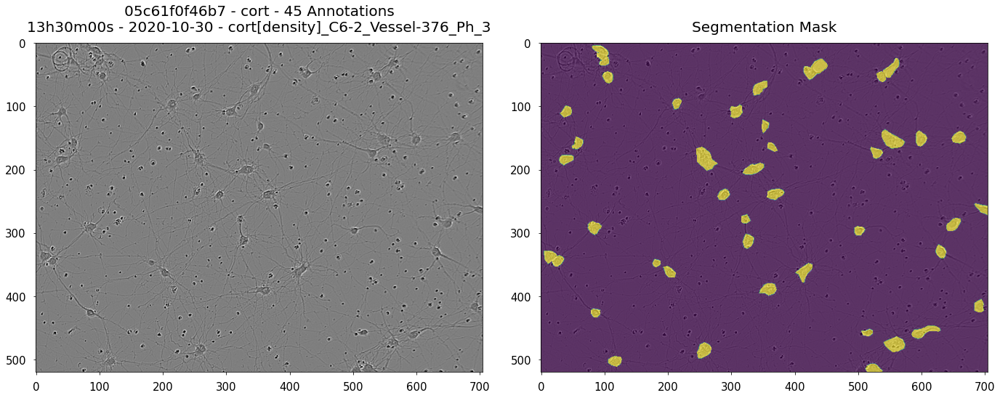

061b49d7dbbb
------------
Image Mean: 127.9610  -  Median: 129.0000  -  Std: 15.1402 - Min: 3.0000 -  Max: 255.0000


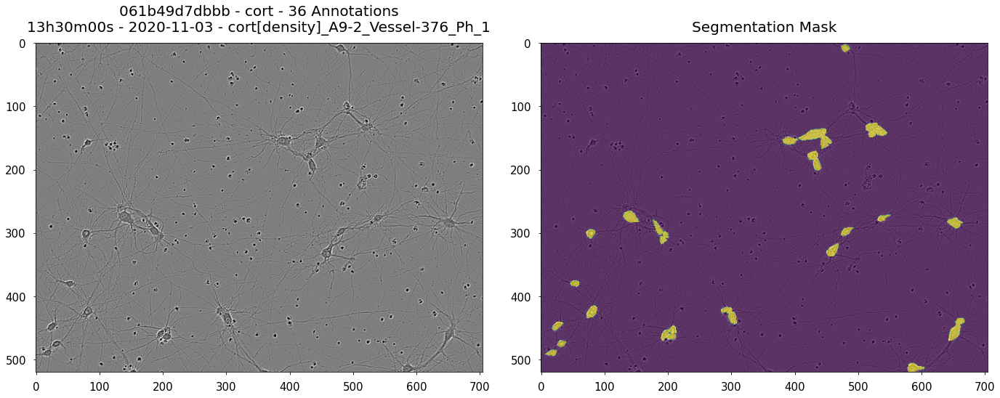

In [13]:
# trimmed to a length of 2 to keep the size of the notebook small

for image_id in train.loc[(train['cell_type'] == 'cort') & (~train['annotation'].isnull()), 'id'].unique()[: 10]:
    visualize_image(df=train, image_id=image_id)

2. ***Neuroblastoma (shsy5y)***

0030fd0e6378
------------
Image Mean: 127.9967  -  Median: 128.0000  -  Std: 14.7286 - Min: 3.0000 -  Max: 255.0000


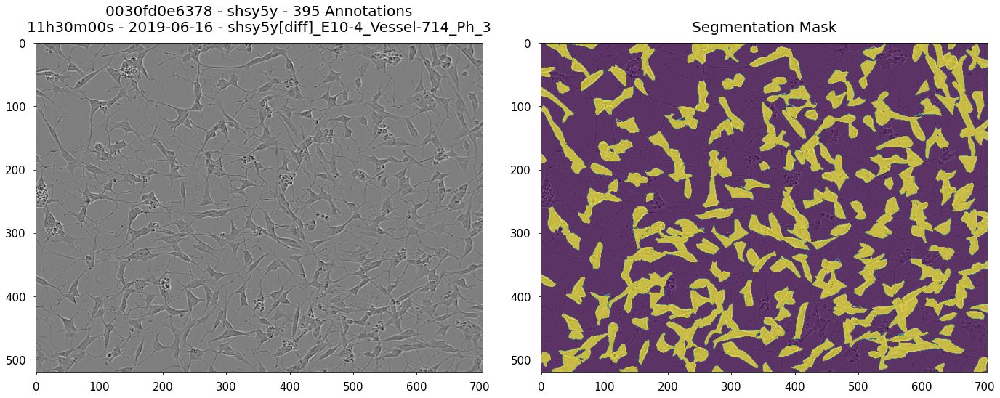

In [14]:
for image_id in train.loc[(train['cell_type'] == 'shsy5y') & (~train['annotation'].isnull()), 'id'].unique()[: 1]:
    visualize_image(df=train, image_id=image_id)

3.  ***Astrocytes (astro)***

0140b3c8f445
------------
Image Mean: 127.9551  -  Median: 128.0000  -  Std: 10.8395 - Min: 3.0000 -  Max: 255.0000


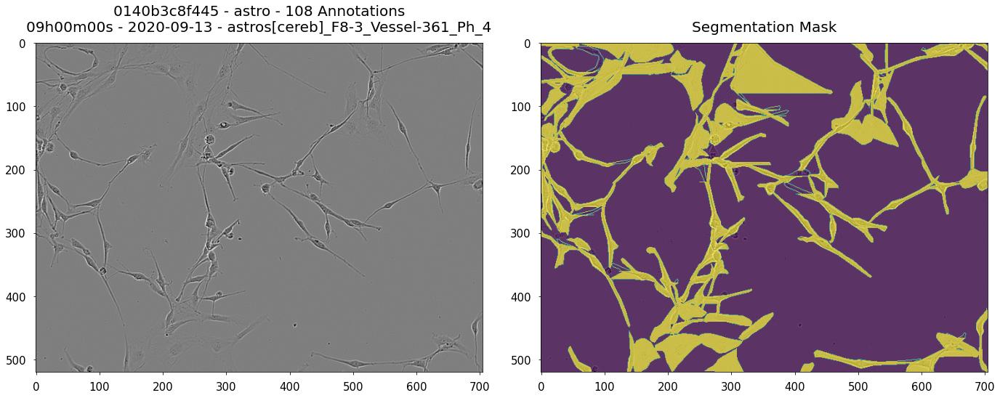

In [15]:
for image_id in train.loc[(train['cell_type'] == 'astro') & (~train['annotation'].isnull()), 'id'].unique()[: 1]:
    visualize_image(df=train, image_id=image_id)